In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import math
import glob
import re
import os
from matplotlib.patches import ConnectionPatch
from pprint import pprint
from sklearn.metrics import average_precision_score
from random import sample

In [2]:
project_root = '/home/davidboja/PycharmProjects/FER/hpatches-benchmark/python/ISPA'

In [3]:
folders = glob.glob(project_root + '/hpatches-sequences-release/*')

# IMPLEMENTATIONS

#### SHI TOMASI

In [4]:
class ShiTomasi():
    '''
    other parameters are left to the default OpenCv parameters
    '''
    def __init__(self, maxCorners=1000000, qualityLevel=0.01,minDistance=10):
        self.maxCorners = maxCorners
        self.qualityLevel = qualityLevel
        self.minDistance = minDistance
        
    def detect(self, img, mask=None):
        keypoints = []
        
        # Already taken care of in the implementation
        # if len(img.shape) == 3:
        #     img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            
        corners = cv2.goodFeaturesToTrack(img,
                                          self.maxCorners,
                                          self.qualityLevel,
                                          self.minDistance)
        corners = np.int0(corners)
        corners = corners[:,0,:]
        
        for i in range(corners.shape[0]):
              keypoints.append(cv2.KeyPoint(x=int(corners[i,0]), 
                                            y=int(corners[i,1]), 
                                            _size=0))
        
        return keypoints

#### CALVIN HARRIS

In [5]:
class HarrisMataHarris():
    def __init__(self, blockSize=2, ksize=3, k=0.04, borderType=cv2.BORDER_DEFAULT):
#         self.src = src
        self.blockSize = blockSize
        self.ksize = ksize
        self.k = k
        self.borderType = borderType
        
    def detect(self, img, mask=None):
        keypoints = []
        
        # already taking care of this in the implementation
        # if len(img.shape) == 3:
        #     img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
            
        dst = cv2.cornerHarris(img,self.blockSize,self.ksize,self.k)
        indexes = np.where(dst>0.01*dst.max())
        
        for i in range(len(indexes[0])):
              keypoints.append(cv2.KeyPoint(x=int(indexes[1][i]), y=int(indexes[0][i]), _size=0))
        
        return keypoints

In [4]:
from own_implementations import *

# TESTING

In [10]:
img = cv2.imread(folders[0][:-6] + 'i_nuts' + '/1.ppm')

In [11]:
gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)

In [12]:
sift = cv2.xfeatures2d.SIFT_create()

In [13]:
kp = sift.detect(gray,None)

In [14]:
asift = ASIFTClass()

In [18]:
kp, des = asift.detectAndCompute(gray, None)

In [57]:
img = cv2.imread(folders[0] + '/1.ppm')

In [58]:
gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)

In [74]:
shi = ShiTomasi()

In [75]:
kp = shi.detect(gray,None)

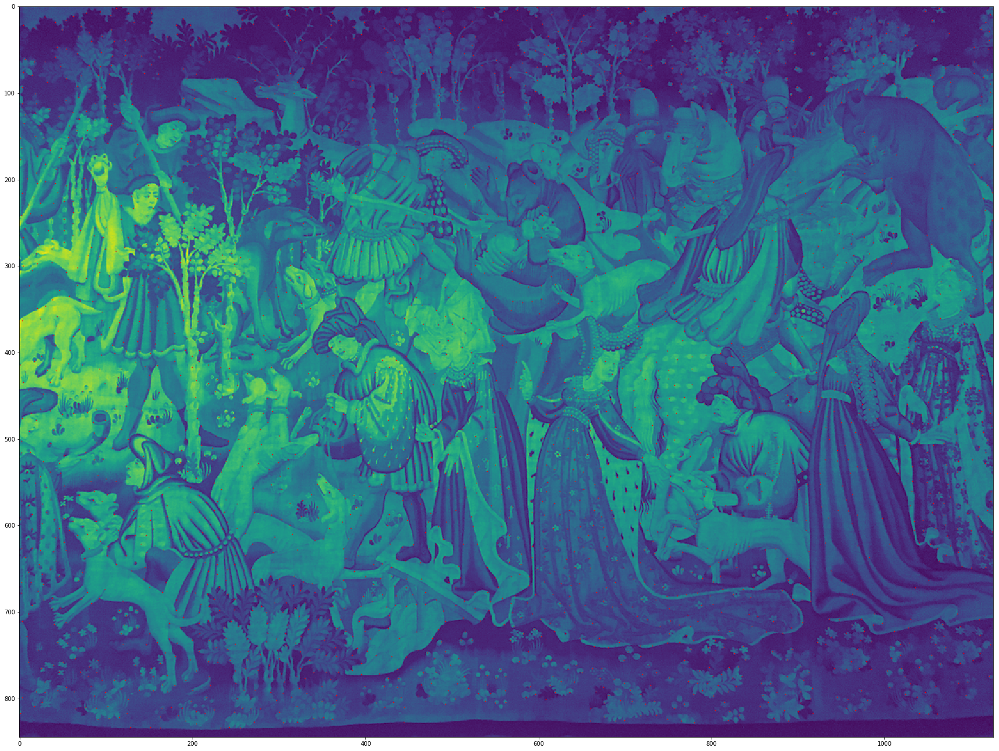

In [76]:
plt.figure(figsize=(30,30))
plt.imshow(gray)
plt.scatter([k.pt[0] for k in kp],[k.pt[1] for k in kp],s=0.5,c='red')
plt.show()

In [77]:
surf = cv2.xfeatures2d.SURF_create()

In [78]:
kp,des = surf.compute(gray, kp)

error: OpenCV(3.4.2) /tmp/build/80754af9/opencv-suite_1535558553474/work/modules/imgproc/src/resize.cpp:4044: error: (-215:Assertion failed) !ssize.empty() in function 'resize'


### MSER

In [30]:
img = cv2.imread(folders[0] + '/1.ppm')

In [19]:
vis = img.copy()
mser = cv2.MSER_create()
regions = mser.detectRegions(img)

In [25]:
m = cv2.MSER_create()

In [26]:
kp = mser.detect(img,None)

In [29]:
kp[0].pt

(33.30418014526367, 379.3573913574219)

### AGAST

In [ ]:
img = cv2.imread(folders[0] + '/1.ppm')

In [33]:
agast = cv2.AgastFeatureDetector_create()

In [34]:
kp = agast.detect(img,None)

In [37]:
len(kp)

25300

### GFTT

In [38]:
img = cv2.imread(folders[0] + '/1.ppm')

In [39]:
gftt = cv2.GFTTDetector_create()

In [40]:
kp = gftt.detect(img,None)

In [42]:
len(kp)

1000

### BRIEF

In [5]:
fast = cv2.FastFeatureDetector_create()

In [6]:
kp = fast.detect(img,None)

In [12]:
len(kp)

21873

In [7]:
brief = cv2.xfeatures2d.BriefDescriptorExtractor_create()

In [8]:
brief

<xfeatures2d_BriefDescriptorExtractor 0x7fa8866fb8d0>

In [9]:
kp, des = brief.compute(img, kp)

In [11]:
des.shape

(21873, 32)

### BRISK

In [7]:
brisk = cv2.BRISK_create()

In [8]:
kp, des = brisk.compute(img,kp)

In [9]:
des

array([[180, 255, 255, ...,  13, 145,   0],
       [255, 191, 231, ..., 255,  29,   1],
       [  4, 122, 255, ..., 242, 255, 123],
       ...,
       [233, 191, 231, ...,   8,  17,  50],
       [252, 127, 195, ...,   8,   0,   0],
       [252, 191, 231, ...,   8,   0,   0]], dtype=uint8)

In [74]:
def hamming_distance(s1, s2):
    assert len(s1) == len(s2)
    return sum(ch1 != ch2 for ch1, ch2 in zip(s1, s2))

In [46]:
sum([a!=b for a,b in zip(list(bin(des[0,1]))[2:],list(bin(des[1,1]))[2:])])

1

In [52]:
s = 0
for i in range(des.shape[1]):
    s += sum([a!=b for a,b in zip(list(bin(des[0,i]))[2:],list(bin(des[1,i]))[2:])])

In [22]:
des[0,:]

array([180, 255, 255, 227,  32,  64,   0,   0, 129, 206,  29, 255, 251,
       255, 255, 247, 223, 127, 237,  49,  14, 227,  48,  15, 227, 161,
        35, 199,  25, 111, 124, 227, 255, 191, 183, 144, 135,  30, 239,
       156, 231, 156, 211,  57,  63, 102, 121, 187,  89, 229, 118, 115,
        93,   6,   0,   0,   0,  10, 196,  37,  18,  13, 145,   0],
      dtype=uint8)

In [23]:
des[1,:]

array([255, 191, 231, 241, 248, 248, 128, 129, 129, 135,   7, 246, 252,
       255, 255, 183, 159, 124, 252, 253, 255, 255,  57, 140,   0,  32,
        48, 226,   0, 165,  60, 227, 223, 255, 255, 190, 247, 252, 255,
       255, 207,  28, 147,  57,   0, 129, 252, 185,  24, 239, 247, 255,
       207, 178, 185, 251, 127,   3,   0,   0, 242, 255,  29,   1],
      dtype=uint8)

array([231, 241], dtype=uint8)

In [24]:
cv2.norm( des[0,:], des[1,:], cv2.NORM_HAMMING)

170.0

In [43]:
type(des[0,0])

numpy.uint8

In [31]:
cv2.norm( des[0,[1,2]], des[1,[1,2]], cv2.NORM_HAMMING)

3.0

In [32]:
type(des[0,:])

numpy.ndarray

In [44]:
a = np.array([2,5,10],dtype=np.uint8)
b = np.array([3,8,11],dtype=np.uint8)

In [45]:
a

array([ 2,  5, 10], dtype=uint8)

In [46]:
b

array([ 3,  8, 11], dtype=uint8)

In [54]:
cv2.norm(a,b, cv2.NORM_HAMMING)

5.0

In [51]:
[bin(a_)[2:] for a_ in a]

['10', '101', '1010']

In [52]:
[bin(a_)[2:] for a_ in b]

['11', '1000', '1011']

'0b11111111'

In [55]:
list([(bin(a)[2:],bin(b)[2:]) for a,b in zip(list(des[0,:]),list(des[1,:]))])

[('10110100', '11111111'),
 ('11111111', '10111111'),
 ('11111111', '11100111'),
 ('11100011', '11110001'),
 ('100000', '11111000'),
 ('1000000', '11111000'),
 ('0', '10000000'),
 ('0', '10000001'),
 ('10000001', '10000001'),
 ('11001110', '10000111'),
 ('11101', '111'),
 ('11111111', '11110110'),
 ('11111011', '11111100'),
 ('11111111', '11111111'),
 ('11111111', '11111111'),
 ('11110111', '10110111'),
 ('11011111', '10011111'),
 ('1111111', '1111100'),
 ('11101101', '11111100'),
 ('110001', '11111101'),
 ('1110', '11111111'),
 ('11100011', '11111111'),
 ('110000', '111001'),
 ('1111', '10001100'),
 ('11100011', '0'),
 ('10100001', '100000'),
 ('100011', '110000'),
 ('11000111', '11100010'),
 ('11001', '0'),
 ('1101111', '10100101'),
 ('1111100', '111100'),
 ('11100011', '11100011'),
 ('11111111', '11011111'),
 ('10111111', '11111111'),
 ('10110111', '11111111'),
 ('10010000', '10111110'),
 ('10000111', '11110111'),
 ('11110', '11111100'),
 ('11101111', '11111111'),
 ('10011100', '111

In [82]:
str1 = ''
for a in list(des[0,:]):
    str1 += bin(a)[2:]

In [83]:
str2 = ''
for a in list(des[1,:]):
    str2 += bin(a)[2:]

In [ ]:
des[1]

In [96]:
a = {'sift':cv2.NORM_HAMMING}

In [97]:
dist_opencv = cv2.norm( des[0,:], des[1,:], a['sift'])

In [98]:
dist_opencv

170.0

### ORB

In [23]:
orb = cv2.ORB_create()

In [24]:
kp = orb.detect(img,None)

In [25]:
kp, des = orb.compute(img, kp)

In [30]:
img = cv2.imread(folders[0] + '/1.ppm')
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

In [31]:
orb = cv2.ORB_create()

In [32]:
kp,des = orb.detectAndCompute(img,None)

In [34]:
len(kp)

500

In [16]:
kp = sift.detect(img,None)

In [13]:
kp, des = orb.compute(img, kp)

error: OpenCV(3.4.2) /tmp/build/80754af9/opencv-suite_1535558553474/work/modules/core/src/matrix.cpp:367: error: (-215:Assertion failed) u != 0 in function 'create'


### FREAK?

In [529]:
img = cv2.imread(folders[0] + '/1.ppm')
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
corners = cv2.goodFeaturesToTrack(gray,25,0.01,10)

In [536]:
corners = np.int0(corners)

In [543]:
corners = corners[:,0,:]

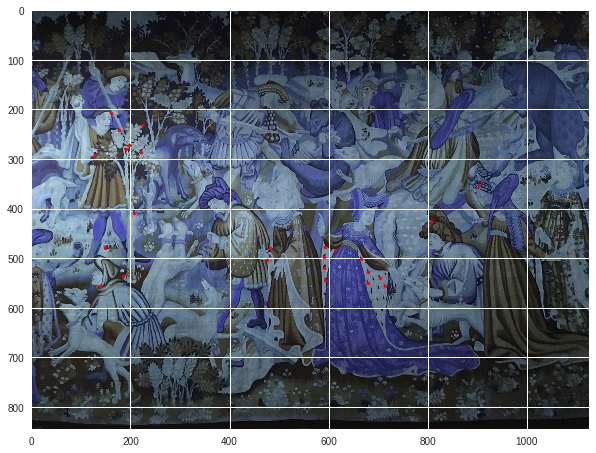

In [547]:
plt.figure(figsize=(10,10))
plt.imshow(img)
plt.scatter(corners[:,0],corners[:,1],s=10,c='red')

In [549]:
img = cv2.imread(folders[0] + '/1.ppm')
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
shi = ShiTomasi()
kp = shi.detect(img,None)

In [551]:
kp_np = np.array([(k.pt[0], k.pt[1], k.angle, k.size, k.response) for k in kp])

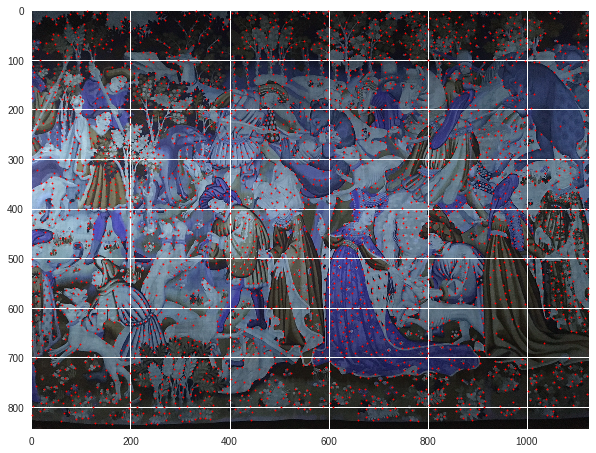

In [553]:
# for k in kp:
#     img[int(k.pt[0]),int(k.pt[1]),:] = [255,0,0]

plt.figure(figsize=(10,10))
plt.scatter(kp_np[:,0],kp_np[:,1], s=2, color='red')
plt.imshow(img)

In [105]:
img = cv2.imread(folders[0] + '/6.ppm')

In [106]:
harimatahari = HarrisMataHarris()

In [107]:
kp = harimatahari.detect(img,None)

In [108]:
kp_np = np.array([(k.pt[0], k.pt[1], k.angle, k.size, k.response) for k in kp])

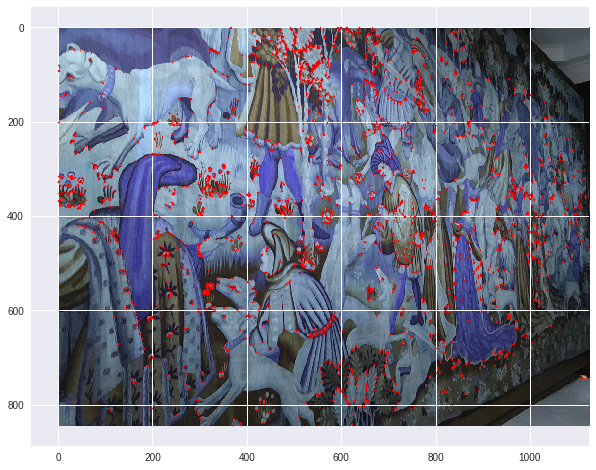

In [109]:
# for k in kp:
#     img[int(k.pt[0]),int(k.pt[1]),:] = [255,0,0]

plt.figure(figsize=(10,10))
plt.imshow(img)
plt.scatter(kp_np[:,0],kp_np[:,1], s=1, color='red')

<Figure size 720x720 with 0 Axes>

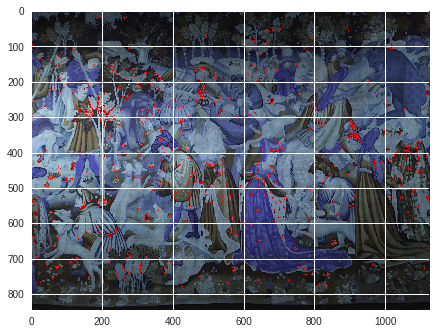

<Figure size 720x720 with 0 Axes>

In [67]:
img2 = cv2.imread(folders[0] + '/1.ppm')
gray = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
dst = cv2.cornerHarris(gray,2,3,0.04)
img2[dst>0.01*dst.max()]=[255,0,0]

plt.imshow(img2)
plt.figure(figsize=(10,10))

In [70]:
# MOJ NACIN ISPISAN
img3 = cv2.imread(folders[0] + '/1.ppm')
gray = cv2.cvtColor(img3, cv2.COLOR_BGR2GRAY)

dst = cv2.cornerHarris(gray,2,3,0.04)
indexes = np.where(dst>0.01*dst.max())

In [71]:
indexes

(array([  0,   0,   0, ..., 829, 829, 829]),
 array([313, 680, 928, ..., 306, 781, 829]))

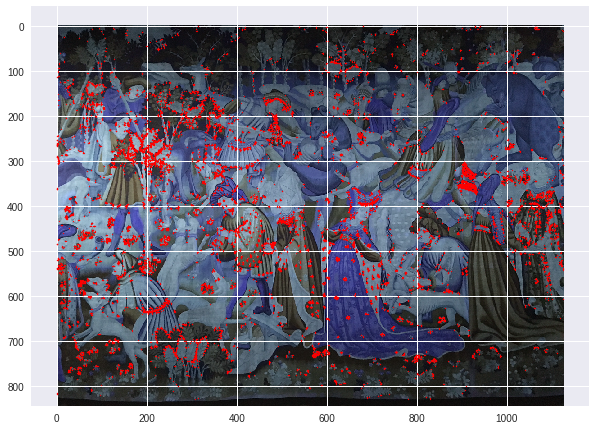

In [72]:
plt.figure(figsize=(10,10))
plt.imshow(img3)
plt.scatter(indexes[1],indexes[0],s=1,c='red')

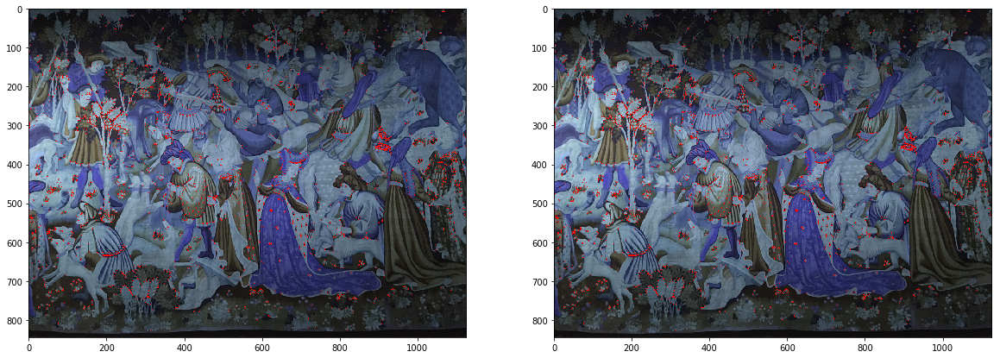

In [262]:
fig, (ax1,ax2) = plt.subplots(nrows=1, ncols=2, figsize=(20,20))

ax1.imshow(img2)

img = cv2.imread(folders[0] + '/1.ppm')
harimatahari = HarrisMataHarris()
kp = harimatahari.detect(img,None)

img = cv2.imread(folders[0] + '/1.ppm')

# ax2.imshow(img)
# ax2.scatter([kp_.pt[0] for kp_ in kp],[kp_.pt[1] for kp_ in kp],s=0.01,c='red')
for k in kp:
    img[int(k.pt[0]),int(k.pt[1]),:] = [255,0,0]
    
ax2.imshow(img)

In [426]:
ime = folders[0][:-6] + 'v_weapons/6.ppm'

In [427]:
ime

'/home/davidboja/PycharmProjects/FER/hpatches-benchmark/python/ISPA/hpatches-sequences-release/v_weapons/6.ppm'

In [428]:
img = cv2.imread(ime)

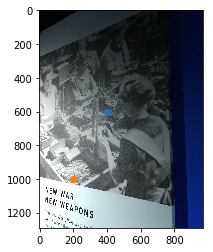

In [429]:
plt.imshow(img)
plt.scatter(400,600)
plt.scatter(200,1000)

In [430]:
harimatahari = HarrisMataHarris()
kp = harimatahari.detect(img,None)

In [431]:
kp_np = np.array([(k.pt[0], k.pt[1], k.angle, k.size, k.response) for k in kp])

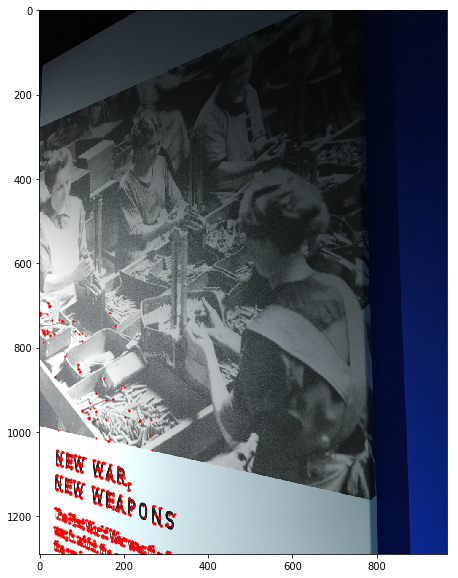

In [433]:
# for k in kp:
#     img[int(k.pt[0]),int(k.pt[1]),:] = [255,0,0]

plt.figure(figsize=(10,10))
plt.scatter(kp_np[:,0],kp_np[:,1], s=1, color='red')
plt.imshow(img)

# AKAZE + AKAZE

In [16]:
img = cv2.imread(folders[0] + '/1.ppm')

In [17]:
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

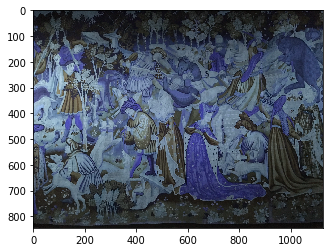

In [8]:
plt.imshow(img)

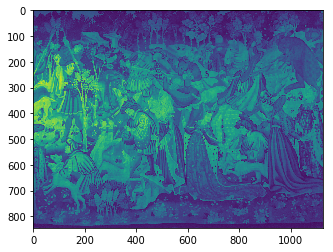

In [9]:
plt.imshow(gray)

In [27]:
sift = cv2.xfeatures2d.SIFT_create()

In [28]:
kpsift = sift.detect(gray,None)

In [31]:
for k in kpsift:
    print(k.octave)

655871
5964543
4129279
3998207
12976639
5571327
5571327
14090751
1901567
8389119
4785151
5046783
5046783
5046783
10224639
10224639
9438207
10813951
2228991
5506047
6684928
11142143
12977151
721407
15664127
15664127
15664127
6357248
4981248
4981248
4391935
7078655
8126975
5505791
5505791
6095359
13566463
3343359
3343359
14156032
14156032
13369600
6488576
2687232
4915967
9765120
11403775
1180159
9634560
7078656
4849920
14221823
6029823
14156799
7668479
13304576
8651008
5112575
10420481
7799295
7799295
4588287
11338239
11338239
3539455
6291967
1508095
8454912
15991807
11076607
6750464
459263
2687999
7406080
7406080
3736575
2097919
8913664
10814463
14221568
14221568
13632511
4522241
11862528
11338239
14549248
6554367
1966592
4915967
10289663
1311487
1442303
1442303
1573375
3736319
11862273
6947583
7340543
852737
9306879
10551808
10551808
1507584
8323839
1573120
9634048
9634048
6095871
3670783
3670783
12059135
12518143
12518143
4326399
9699839
8061439
12714496
12714496
13697535
5374719
8717

4522495
13762816
9110271
7865087
14418688
14418688
4194815
1704703
10682624
6095871
6095871
10617855
10617855
6620159
5702143
9110527
3932671
7667968
7995903
2425343
5833215
5767679
14090751
11797248
13698047
13698047
1966848
12583425
7078655
7078655
11141377
3998209
11535103
4325632
4325632
7012863
4325887
1966592
7864831
3408128
11862528
8585472
3277311
6161407
10420481
10420481
12649471
13828863
10486528
3998463
9372415
9372415
4981247
4981247
10683136
15794687
15794687
10158847
15205375
14877184
14877184
14877184
197631
197631
6029568
1573375
13042431
13042431
8586239
8586239
13304320
7799295
13959679
9306627
12124930
9175297
9175297
3474175
5964032
4391169
10027775
590847
590847
10093055
8258303
13239039
2228991
12452608
12452608
12452608
4981247
14615551
12518399
3342847
10355711
3342848
11207679
8454911
9831169
5505535
3080961
10617343
3801599
13304575
1835775
13894143
15336191
1966847
6750719
6750719
5243647
2884095
2884607
8192511
8192511
6947330
6947330
15794689
15794689
1901

5243647
5243647
8127231
7013119
9437697
1769983
8716799
8716799
4260863
4260863
10289919
1311488
918527
3146495
4391679
4391679
14746623
197121
6947328
13632255
13632255
13632255
8192767
7930112
9568767
7144447
6947073
6947073
10486783
10551808
4654079
11141378
9634048
11666431
12648959
11600128
14549503
721152
6291967
525055
15467007
9437695
5964799
6947327
6947327
7930367
11862783
6553856
7930368
14746111
14746111
6620159
6620159
13894143
13894143
6488575
3736319
15794432
11862527
14483712
15401216
7668225
13435648
6685695
7144191
3080959
4260863
11666175
13239295
7013119
7013119
983807
983807
13239039
12255999
5964287
6029568
6816511
6816511
5767935
5964033
14352895
6882047
10552319
6750976
8389375
8389375
8520191
9044479
3670783
9372159
9699839
9699839
1245951
9830656
6620159
9765376
13107711
13632001
2228735
2228735
12124927
12124927
11273215
11273215
14222335
8126975
8126975
6489087
262911
262911
4129535
7012863
5964032
10420480
7799040
9503232
11731455
5571072
9110527
9110527
64

7209216
6357503
7799295
7340543
7274754
7274754
14811392
7602943
7602943
8716799
13566208
4915456
14156287
6423039
14156287
10028031
14746111
14746111
8454655
16647167
2556415
2556415
9700351
6095104
11928063
9306623
6947583
6947583
7536896
7799295
2687487
3473919
3473919
7537407
7667968
11731456
12190463
6816255
6816255
5309439
3408895
6685183
6685183
6685183
14680831
2228735
1311231
12715007
3277056
6095615
3933183
3933183
11993599
2359807
4522240
197119
2818304
7537152
7537152
7537152
6816256
2818816
4719103
11600129
11600129
14418431
3474178
3474178
6357760
2687743
2687743
1049088
6881792
6881792
11403775
14352895
2556927
7733504
8585727
10093312
11534847
7209217
7209217
3145984
12386560
10945025
1442559
9044479
2491135
7668223
9241599
3735808
12321791
12583423
7668223
11338495
4916223
4916223
7209471
7209471
11731455
11535359
4719106
3932927
3932927
11796991
14353152
9634303
1835265
12780031
12256255
3473919
9831169
1836031
9306880
15729151
6750719
787200
8454655
6423039
12648959


9437695
15467007
1442303
12780031
5506047
12386815
12386815
655872
655872
655872
12124671
4588287
4588287
4588287
7603199
11010559
5046784
2949887
10355199
12977151
2228735
7275263
12256255
4063743
10879487
10879487
15533055
6881791
12321279
3867391
12517632
12911359
8061439
1311231
4129026
8127231
8127231
6619647
6619647
13239039
14091263
12452354
7668223
11534595
5374975
5374975
11796992
11272703
7471872
3080703
6751231
6751231
10617343
14352641
2950143
13828353
11665919
6291712
917760
917760
12452352
15139583
2359552
1901056
7472127
7472127
7472127
11928319
8847618
13500927
12583168
10617088
9961983
10420735
13107459
1901055
1901055
11404031
10551807
10551807
11928063
7734271
9896959
1901055
1508095
1508095
6750975
16384768
16384768
2818559
15401471
15401471
12387071
1704447
1376767
5964543
3474431
11469056
7078399
10813951
9241087
13894143
4587776
7602943
7209471
9962495
13042687
2294783
3801599
12190463
12125183
6816259
6947075
6947075
9699840
14156287
7733759
7733759
4850431
7537

10552064
8192768
7733504
9110271
15074303
1901313
1901313
9175296
9175296
9175296
13107967
13172993
10682879
5702655
16646400
11207169
11207169
4784895
9503231
15336447
8651520
5702145
6160896
5702143
5702143
2098175
8389631
3932417
8389375
5440256
7471360
7471360
2753279
15860479
6554111
5178111
11534847
8586239
2097408
10813696
13566209
14091263
9502977
5505281
6095871
8454911
7930879
2490880
4719615
7799295
328447
3473919
10159103
2884096
15074303
3932927
8717056
8717056
9306623
8520191
8520191
9503487
4260607
5243391
13239039
14483967
1245695
2687487
2687487
12714240
2687232
2687232
12910848
6947839
6947839
9830911
6357503
15467263
4457471
4457471
9372160
9372160
3933183
9306880
15204864
2425088
14680320
14680320
8389375
1245951
1245951
15204863
8782080
8782080
2491135
6160895
15139327
6095615
11731967
12648704
6751231
4064255
7995903
3801599
3801599
7275263
10093567
15336447
12714495
5374719
2425343
16515839
2032639
4063743
16646655
16646655
983807
7864831
13370111
10683135
197375

In [18]:
akaze = cv2.AKAZE_create()

In [19]:
kp = akaze.detect(gray,None)

In [20]:
len(kp)

3461

In [25]:
kp[0].octave

0

In [26]:
for kp_ in kp:
    if kp_.octave != 0:
        print(kp_.octave)

1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1


In [13]:
kp, des = akaze.compute(gray,kp)

In [14]:
des[0,:]

array([ 32, 125,   3,   4,   0,  17,  48,  18,  73,  74, 228,  13,   1,
        32, 255,  15,   0, 224,   5, 184,   0,   0,  16,   0,   0,   2,
         0,  24, 255,   8,  62, 130, 232, 127,  23,  68,  69,   4, 162,
       207,  16,  17, 205,  34, 100, 207,   1,  30,   0,  10, 112,   0,
        71, 253, 255, 235, 227, 255, 253, 255,  11], dtype=uint8)

In [15]:
des[1,:]

array([  0, 238,   7,   0,  18,  34,  39, 128, 224,   7, 122, 158, 207,
        65, 252, 255,   0,  32,   0,   0,   0,  31, 241,   8,   0,  68,
        68,  32, 136, 255,  32,  10, 128, 130,  82,  85, 255,  15, 128,
       170,   1, 116, 163, 126, 213, 218,  99, 254, 152,  30, 211,   0,
       136, 104, 246, 255, 239, 131, 233, 255,  62], dtype=uint8)

In [16]:
des.shape

(3461, 61)

In [22]:
# create BFMatcher object
bf = cv2.BFMatcher(cv2.HAMMING_NORM_TYPE)
# Match descriptors.
matches = bf.match(des[0,:],des[1,:])

# KAZE + KAZE

In [36]:
img = cv2.imread(folders[0] + '/1.ppm')

In [37]:
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

In [38]:
kaze = cv2.KAZE_create()

In [39]:
kp = kaze.detect(gray,None)

In [40]:
kaze2 = cv2.KAZE_create()

In [41]:
kp, des = kaze2.compute(gray, kp)

In [44]:
des

array([[ 0.00444667, -0.00334349,  0.00518781, ..., -0.00020371,
         0.00675549,  0.02332182],
       [ 0.01469353, -0.00487296,  0.02393099, ...,  0.11065019,
         0.08986261,  0.11426152],
       [ 0.08112439,  0.01999637,  0.10222723, ...,  0.00250122,
         0.07700311,  0.05744464],
       ...,
       [ 0.05132578,  0.03180215,  0.18436606, ...,  0.00764481,
         0.11975406,  0.07680491],
       [ 0.0370164 , -0.03562932,  0.0808986 , ..., -0.06668115,
         0.07502841,  0.0860665 ],
       [-0.02770931, -0.04093799,  0.10112006, ...,  0.02102205,
         0.04398942,  0.03739665]], dtype=float32)

# KAZE + AKAZE

In [107]:
img = cv2.imread(folders[0] + '/1.ppm')

In [108]:
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

In [109]:
kaze = cv2.KAZE_create()

In [110]:
kp = kaze.detect(gray,None)

In [111]:
akaze = cv2.AKAZE_create()

In [112]:
kp, des = akaze.compute(gray, kp)

In [113]:
np.unique(np.array([k.class_id for k in kp]))

array([ 1,  3,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14])

In [114]:
des

array([[127, 249,   1, ...,   0,   0,   1],
       [ 95, 160, 253, ...,   2, 240,   8],
       [218,  89,   3, ..., 255, 239,  31],
       ...,
       [247, 249, 253, ..., 127, 179,  32],
       [255, 201, 255, ...,   6,   0,  31],
       [119,  73, 255, ..., 134,   0,  63]], dtype=uint8)

In [115]:
len(kp)

3462

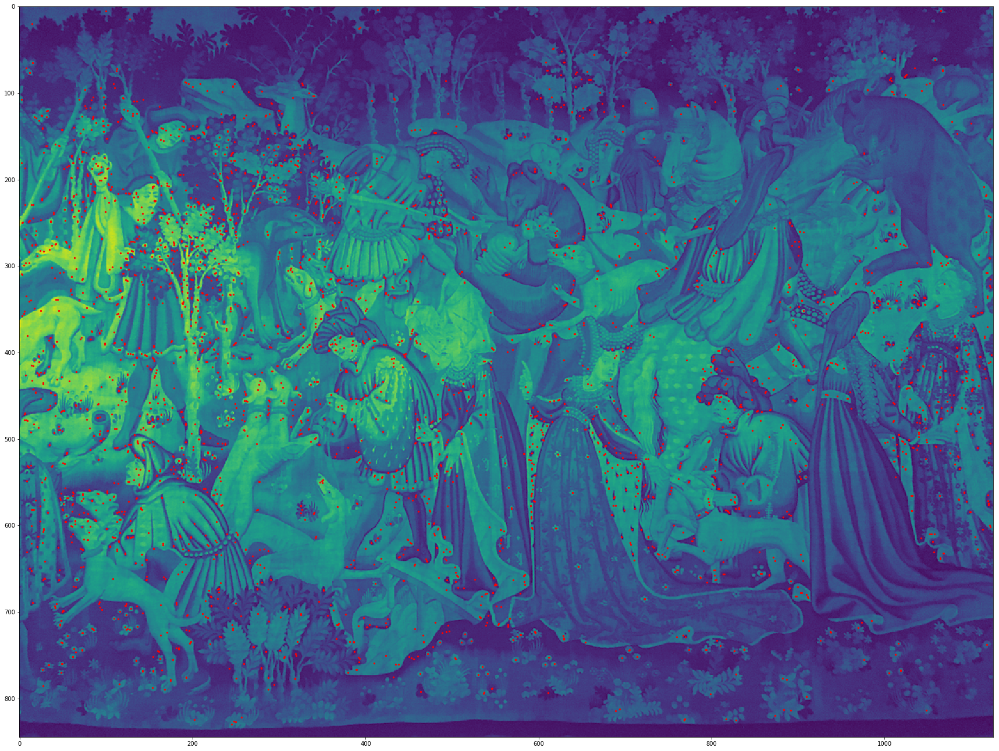

In [116]:
plt.figure(figsize=(30,30))
plt.imshow(gray)
plt.scatter([k.pt[0] for k in kp],[k.pt[1] for k in kp],s=5,c='red')
plt.show()

# AKAZE + KAZE

In [152]:
img = cv2.imread(folders[0] + '/1.ppm')

In [153]:
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

In [154]:
akaze = cv2.AKAZE_create()

In [155]:
kp = akaze.detect(gray,None)

In [156]:
kaze = cv2.KAZE_create()

In [157]:
kp, des = kaze.compute(gray, kp)

In [161]:
len(kp)

3461

In [159]:
des

array([[        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       [        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       [        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       ...,
       [-0.01127056,  0.00160562,  0.12086095, ..., -0.02021885,
         0.08838885,  0.13306125],
       [ 0.01841875, -0.00795555,  0.04250604, ..., -0.03287951,
         0.09921888,  0.12326404],
       [ 0.02940687, -0.00590771,  0.0634249 , ..., -0.01758356,
         0.09805858,  0.07180332]], dtype=float32)

In [160]:
des.shape

(3461, 64)

### CENSURE

In [91]:
from skimage.feature import CENSURE

In [92]:
img = cv2.imread(folders[0] + '/1.ppm')

In [93]:
censure = CENSURE()

In [95]:
gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)

In [96]:
censure.detect(gray)

In [97]:
censure.keypoints.shape

(270, 2)

In [98]:
class CensureClass():

    def detect(self, img, mask=None):
        keypoints = []

        censure = skimage.feature.CENSURE()
        censure.detect(img)

        for i in range(censure.keypoints.shape[0]):
              keypoints.append(cv2.KeyPoint(x=censure.keypoints[i,1],
                                            y=censure.keypoints[i,0],
                                            _size=0))

        return keypoints

In [99]:
a = CensureClass()

In [100]:
gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)

In [101]:
kp = a.detect(gray,None)

In [102]:
len(kp)

270

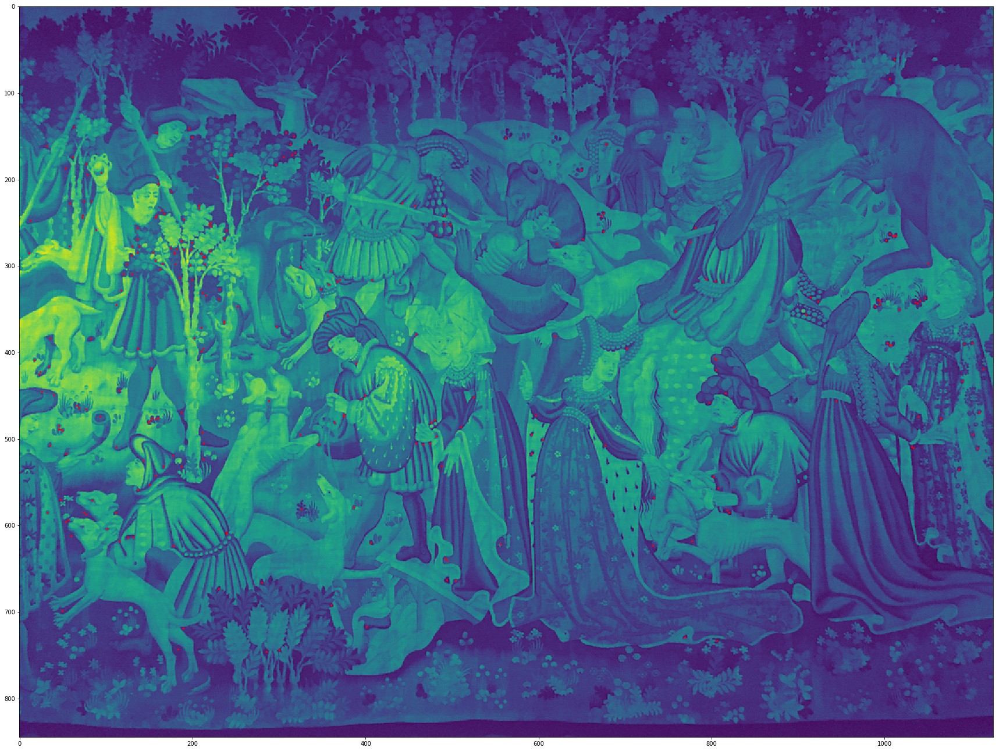

In [106]:
plt.figure(figsize=(30,30))
plt.imshow(gray)
plt.scatter([k.pt[0] for k in kp],[k.pt[1] for k in kp],s=5,c='red')
plt.show()

### DAISY

In [72]:
from skimage.feature import daisy

In [73]:
img = cv2.imread(folders[0] + '/1.ppm')

In [74]:
gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)

In [76]:
descs = daisy(gray)

In [78]:
descs.shape

(204, 274, 200)

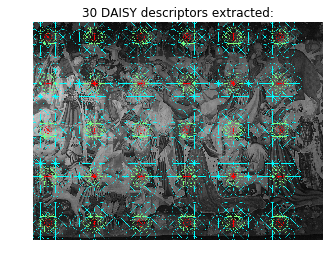

In [79]:
from skimage.feature import daisy
from skimage import data
import matplotlib.pyplot as plt


img = cv2.imread(folders[0] + '/1.ppm')
gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
descs, descs_img = daisy(gray, step=180, radius=58, rings=2, histograms=6,
                         orientations=8, visualize=True)

fig, ax = plt.subplots()
ax.axis('off')
ax.imshow(descs_img)
descs_num = descs.shape[0] * descs.shape[1]
ax.set_title('%i DAISY descriptors extracted:' % descs_num)
plt.show()

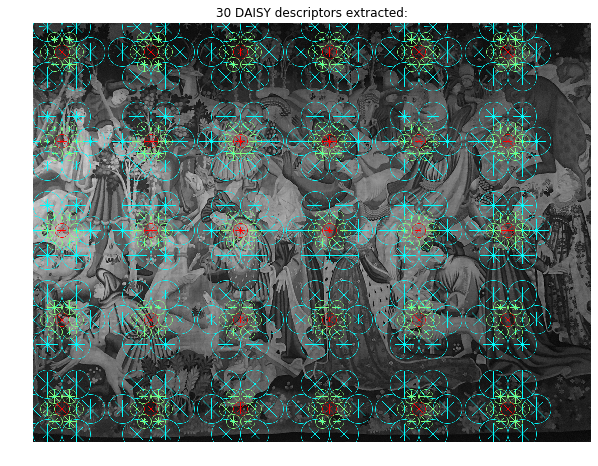

In [81]:
fig, ax = plt.subplots(figsize=(10,10))
ax.axis('off')
ax.imshow(descs_img)
descs_num = descs.shape[0] * descs.shape[1]
ax.set_title('%i DAISY descriptors extracted:' % descs_num)
plt.show()

### HOG

In [82]:
from skimage.feature import hog

In [83]:
img = cv2.imread(folders[0] + '/1.ppm')

In [92]:
img.shape

(845, 1126, 3)

In [84]:
gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)

In [89]:
fd = hog(gray,feature_vector=False)

In [91]:
fd.shape

(103, 138, 3, 3, 9)

### ROOTSIFT

In [96]:
img = cv2.imread(folders[0] + '/1.ppm')

In [97]:
gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)

In [104]:
class RootSIFT:
    def __init__(self, eps=1e-7):
        self.eps = eps
        
 
    def compute(self, image, kp):
        sift = cv2.xfeatures2d.SIFT_create()
        kp, des = sift.compute(image, kp)
 
        if len(kp) == 0:
            return ([], None)
 
        # apply the Hellinger kernel by first L1-normalizing and taking the
        # square-root
        des /= (des.sum(axis=1, keepdims=True) + self.eps)
        des = np.sqrt(des)
        #descs /= (np.linalg.norm(descs, axis=1, ord=2) + eps)
        
        return kp, des

In [105]:
rsift = RootSIFT()

In [106]:
sift_ = cv2.xfeatures2d.SIFT_create()

In [107]:
kp = sift_.detect(gray,None)

In [109]:
kp, des = rsift.compute(gray,kp)

In [112]:
des.shape

(9122, 128)

### ASIFT

In [117]:
img = cv2.imread(folders[0] + '/1.ppm')

In [118]:
gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)

In [119]:
from other_algorithms.asift import affine_detect

In [120]:
class ASIFTClass():

    def detectAndCompute(self, img, mask=None):
        kp, des = affine_detect(cv2.xfeatures2d.SIFT_create(), img, pool=None)

        return kp, des

In [121]:
asift = ASIFTClass()

In [122]:
kp,des = asift.detectAndCompute(gray,None)

affine sampling: 43 / 43


In [123]:
len(kp)

139216

In [124]:
des

array([[12.,  1.,  6., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  6.,  4., 15.],
       [ 2.,  1.,  2., ...,  0.,  0.,  0.],
       ...,
       [ 0.,  1.,  3., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ..., 11.,  0.,  7.],
       [ 0.,  0.,  0., ..., 37.,  1.,  3.]], dtype=float32)

In [133]:
img.shape

(845, 1126, 3)

In [139]:
img[0,1,:].shape

(3,)

In [146]:
np.max([k.pt[1] for k in kp])

838.259765625

In [147]:
img.shape

(845, 1126, 3)

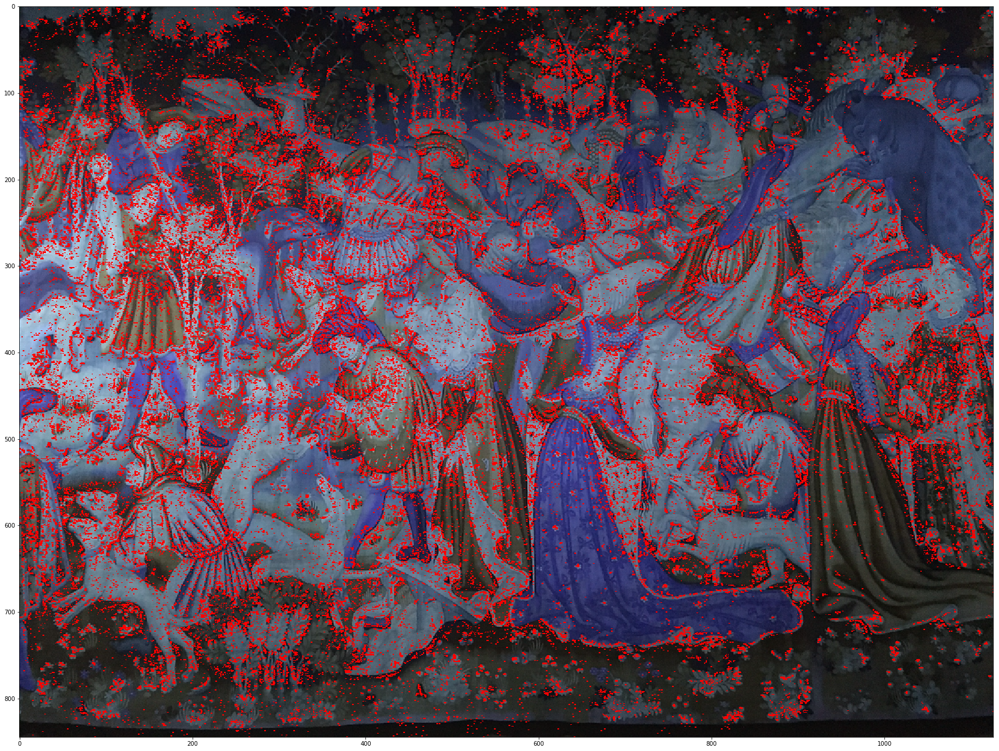

In [151]:
plt.figure(figsize=(30,30))
# plt.imshow(gray)
for k in kp:
    img[int(k.pt[1]),int(k.pt[0])-1,:] = np.array([255,0,0]).reshape(3,)
# plt.scatter([k.pt[0] for k in kp],[k.pt[1] for k in kp],s=0.01,c='red')
plt.imshow(img)
plt.show()

### SUSAN

In [18]:
img = cv2.imread(folders[0] + '/1.ppm')

In [19]:
gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)

In [28]:
from other_algorithms.susan import susanCorner

In [31]:
kp = susanCorner(gray)

In [33]:
kp.shape

(845, 1126)

In [36]:
gray.shape

(845, 1126)

In [37]:
np.where(kp>0)

(array([  0,   0,   0, ..., 828, 828, 828]),
 array([306, 312, 567, ..., 306, 318, 828]))

In [50]:
class SusanClass():

    def detect(self, img, mask=None):
        keypoints = []
        
        kp = susanCorner(img)
        
        kp = np.where(kp>0)
        
        for i in range(len(kp[0])):
            keypoints.append(cv2.KeyPoint(x=kp[0][i], 
                                          y=kp[1][i], 
                                          _size=0))

        return keypoints

In [51]:
sus = SusanClass()

In [52]:
kp = sus.detect(gray,None)

In [53]:
kp

[<KeyPoint 0x7fd625f71990>,
 <KeyPoint 0x7fd625f719f0>,
 <KeyPoint 0x7fd625f71ab0>,
 <KeyPoint 0x7fd625f71f90>,
 <KeyPoint 0x7fd625f718d0>,
 <KeyPoint 0x7fd625f71ba0>,
 <KeyPoint 0x7fd625f719c0>,
 <KeyPoint 0x7fd625f71cf0>,
 <KeyPoint 0x7fd6266cf420>,
 <KeyPoint 0x7fd6266cf3f0>,
 <KeyPoint 0x7fd6266cf270>,
 <KeyPoint 0x7fd6266cf4e0>,
 <KeyPoint 0x7fd6266cf2d0>,
 <KeyPoint 0x7fd6266cf180>,
 <KeyPoint 0x7fd6266cf360>,
 <KeyPoint 0x7fd6266cf120>,
 <KeyPoint 0x7fd6266cf2a0>,
 <KeyPoint 0x7fd6266cf150>,
 <KeyPoint 0x7fd6266cf240>,
 <KeyPoint 0x7fd6266cf060>,
 <KeyPoint 0x7fd6266cf030>,
 <KeyPoint 0x7fd6266cf210>,
 <KeyPoint 0x7fd6266cf1e0>,
 <KeyPoint 0x7fd6266cf1b0>,
 <KeyPoint 0x7fd6266cf390>,
 <KeyPoint 0x7fd6266cf450>,
 <KeyPoint 0x7fd6266cf0c0>,
 <KeyPoint 0x7fd6266cf480>,
 <KeyPoint 0x7fd6266cf330>,
 <KeyPoint 0x7fd6266cf510>,
 <KeyPoint 0x7fd6266cf4b0>,
 <KeyPoint 0x7fd6266cf0f0>,
 <KeyPoint 0x7fd6266cf540>,
 <KeyPoint 0x7fd6266cf570>,
 <KeyPoint 0x7fd6266cf5a0>,
 <KeyPoint 0x7fd6266